# November 3-10, 2022: ABA dataset: ABA ROIs: Finding ROI communities

In [1]:
import os 
import sys
from os.path import join as pjoin
import numpy as np
import scipy as sp
import pandas as pd
from tqdm.notebook import tqdm
import pickle, random
import csv
import bct
from copy import deepcopy

# niimg
import nilearn
from nilearn import (image, masking)

# main dirs
proj_dir = pjoin(os.environ['HOME'], 'network_dynamics')
results_dir = pjoin(os.environ['HOME'], 'results')
month_dir = f"{proj_dir}/nb/nov22"

# plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParamsDefault['font.family'] = "sans-serif"
plt.rcParamsDefault['font.sans-serif'] = "Arial"
plt.rcParams['font.size'] = 14
plt.rcParams["errorbar.capsize"] = 0.5

import cmasher as cmr  # CITE ITS PAPER IN YOUR MANUSCRIPT

# folders
sys.path.insert(0, proj_dir)
import helpers.dataset_utils_v1 as dataset_utils
import helpers.isc_utils as isc_utils
import helpers.fc_utils as fc_utils
import helpers.network_utils as network_utils

In [2]:
class ARGS(): pass
args = ARGS()

args.SEED = 74
np.random.seed(args.SEED)

args.LABEL_NAMES = ['highT', 'lowT', 'highR', 'lowR']
args.NAMES = ['high_Threat', 'low_Threat', 'high_Reward', 'low_Reward']
args.VALENCE = ['Threat', 'Reward']
args.LEVELS = ['high', 'low']
args.TRIAL_LEN = 13
args.TR = 1.25
LATE = (np.arange(-3*args.TR, 2*args.TR, args.TR) // args.TR + 8.0).astype(int)
WHOLE = (np.arange(-8*args.TR, 5*args.TR, args.TR) // args.TR + 8.0).astype(int)
args.PERIOD_TRS = {'LATE': LATE, 'WHOLE':WHOLE}

In [3]:
args.PERIOD_TRS

{'LATE': array([5, 6, 7, 8, 9]),
 'WHOLE': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])}

In [4]:
args.proj_dir = proj_dir
args.results_dir = results_dir

args.roi_set_name = 'aba'
args.main_data_dir = (
    f"{args.proj_dir}/data/aba/data/ROI_trialwise_13TR_4plays_offset_reducedRuns/unassumed/rois-{args.roi_set_name}"
)
# exploratory data
args.subjects = os.listdir(args.main_data_dir)
random.Random(args.SEED).shuffle(args.subjects)
args.explor_subjects = args.subjects[ : round(0.25 * len(args.subjects))]

# ROIs
args = dataset_utils.get_aba_rois(args)

## dataset

  0%|          | 0/25 [00:00<?, ?it/s]

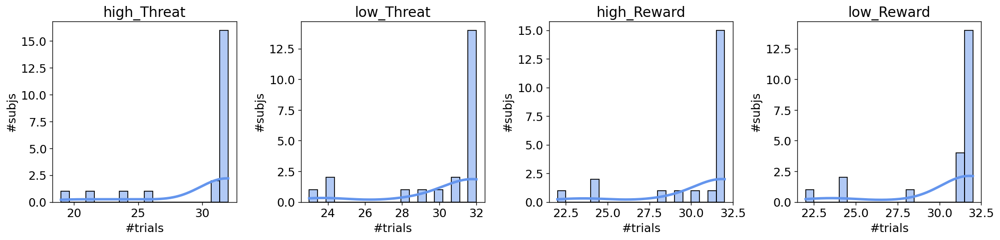

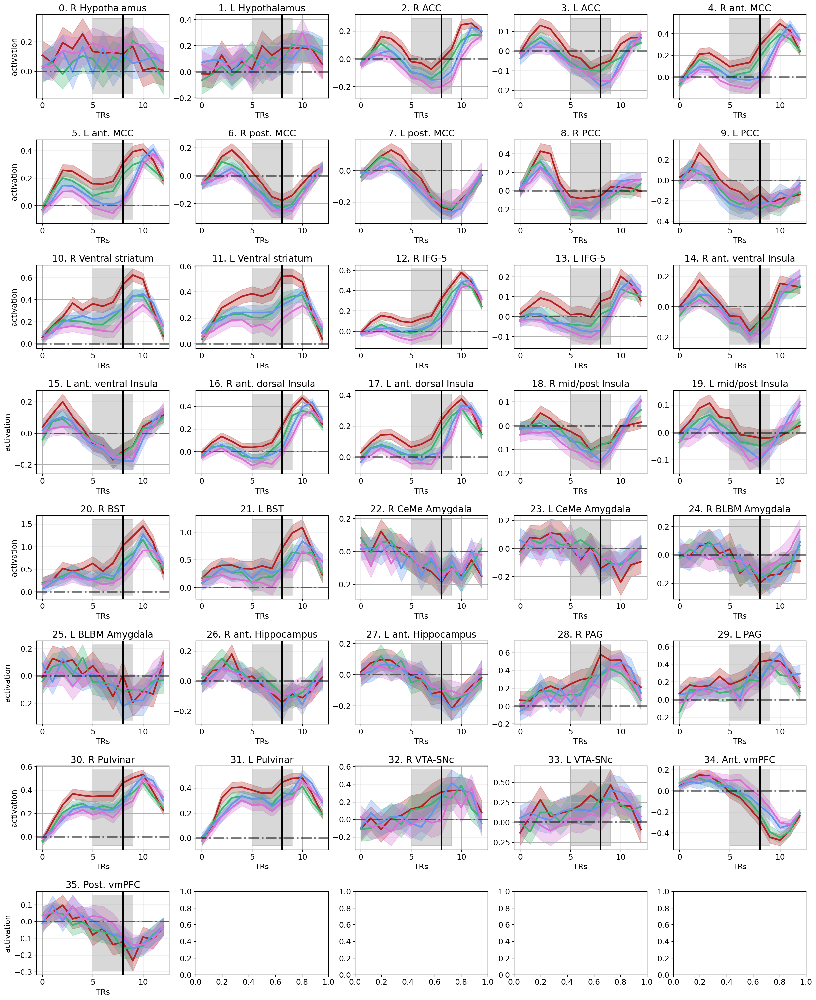

In [5]:
X, lens = dataset_utils.get_aba_trial_level_responses(args)
args.plot_colors = {
    'high_Threat': 'firebrick', 'low_Threat': 'mediumseagreen', 
    'high_Reward': 'cornflowerblue', 'low_Reward': 'orchid'
}
dataset_utils.plot_aba_responses(args, X)

In [6]:
for name in X.keys():
    print(f"{name}: {len(X[name])} subjs: {X[name][0].shape} trial x time x roi")

high_Threat: 22 subjs: (32, 13, 36) trial x time x roi
low_Threat: 22 subjs: (32, 13, 36) trial x time x roi
high_Reward: 22 subjs: (32, 13, 36) trial x time x roi
low_Reward: 22 subjs: (31, 13, 36) trial x time x roi


## LATE period

### FC

high_Threat: (22, 95, 36)
low_Threat: (22, 115, 36)
high_Reward: (22, 110, 36)
low_Reward: (22, 110, 36)


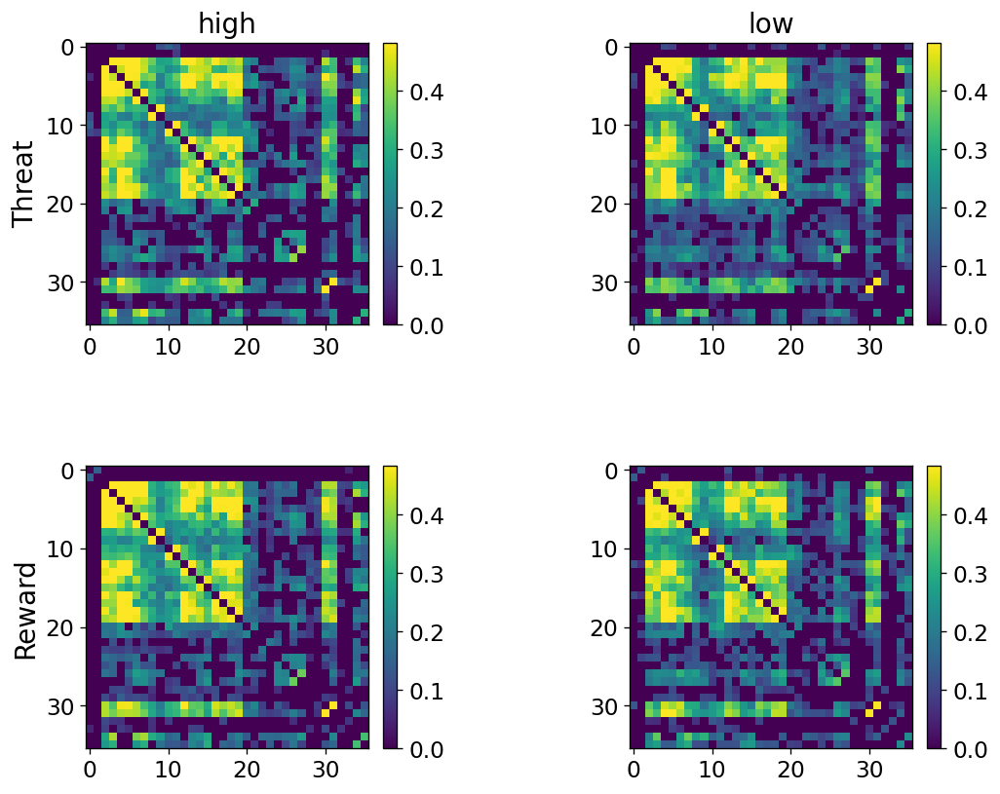

In [7]:
# subject-wise time series for LATE period
ts = dataset_utils.get_aba_block_time_series(
    args, 
    X, 
    trial_option='concat',
    subj_axis=0,
    period='LATE',
)
for block in ts.keys():
    print(f"{block}: {ts[block].shape}")

# FC
args.n_bootstraps = 1000
(
    corrs, 
    bootstraps, 
    rois
) = fc_utils.get_fcs(
    args, 
    ts, 
    print_stats=False
)

(
    observed_fcs, observed_p_vals, 
    significant_rois, conf_intervals
) = fc_utils.get_squareform_matrices(
    args, 
    bootstraps, 
    rois,
    threshold_mats=True
)

isc_utils.plot_aba_isfcs(
    args, 
    observed_fcs, 
    significant_rois,
    cmap=mpl.colormaps['viridis'],
    corr_type='fc'
)

### communities

In [8]:
args.gamma = 1.5
args.tau = 0.1
args.num_reps = 1000
(
    agreement_mat, 
    partition
) = network_utils.consensus_partition(
    args, 
    observed_fcs
)

  0%|          | 0/4 [00:00<?, ?it/s]

#### individual condition based

##### `high_Threat` based

In [9]:
# network_utils.plot_aba_nwwise_responses(
#     args, 
#     X=X,
#     partition=partition,
#     block='high_Threat',
# )

##### `low_Threat` based

In [10]:
# network_utils.plot_aba_nwwise_responses(
#     args, 
#     X=X,
#     partition=partition,
#     block='low_Threat',
# )

##### `high_Reward` based

In [11]:
# network_utils.plot_aba_nwwise_responses(
#     args, 
#     X=X,
#     partition=partition,
#     block='high_Reward',
# )

##### `low_Reward` based

In [12]:
# network_utils.plot_aba_nwwise_responses(
#     args, 
#     X=X,
#     partition=partition,
#     block='low_Reward',
# )

#### combining condition-wise partitions

In [13]:
cis = [partition[block] for block in partition.keys()]
cis = np.stack(cis, axis=-1)
D = bct.clustering.agreement(cis) / cis.shape[-1]
ciu = bct.clustering.consensus_und(
    D, 
    tau=args.tau,
    gamma=args.gamma,
    reps=args.num_reps,
    seed=args.SEED
)

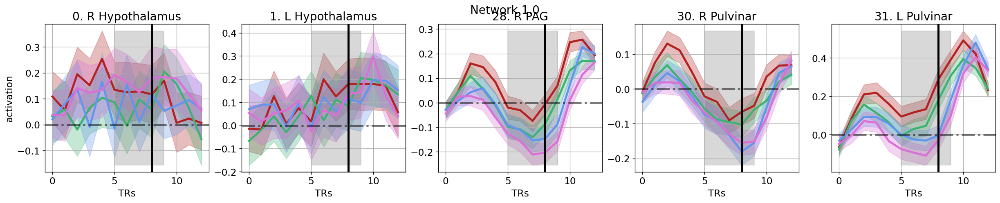

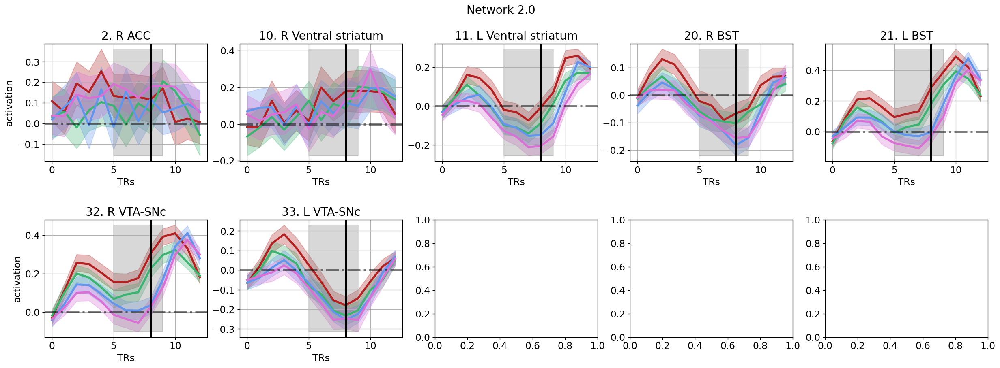

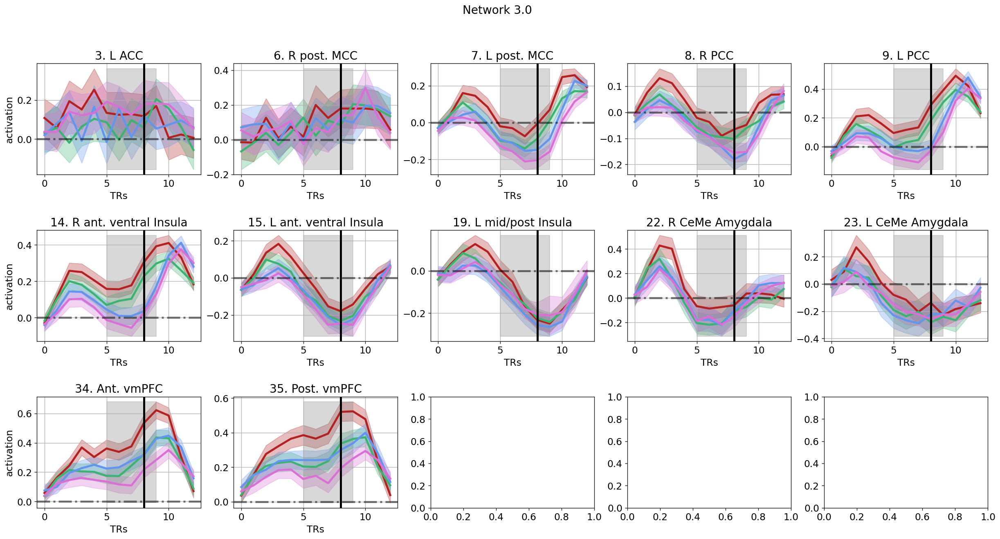

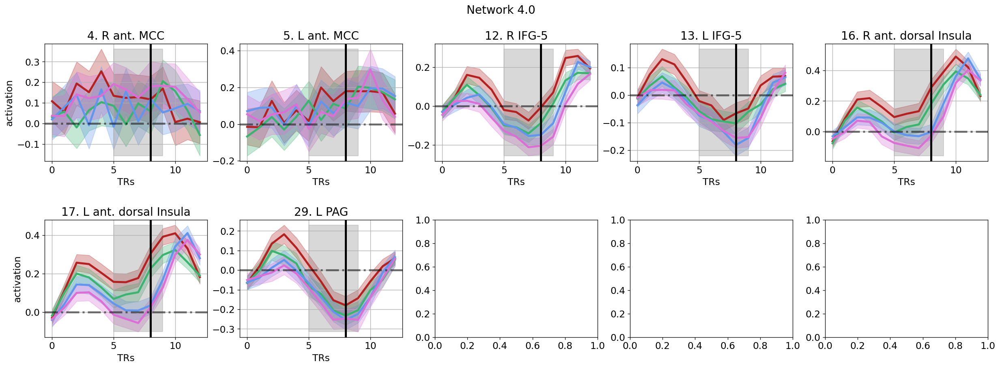

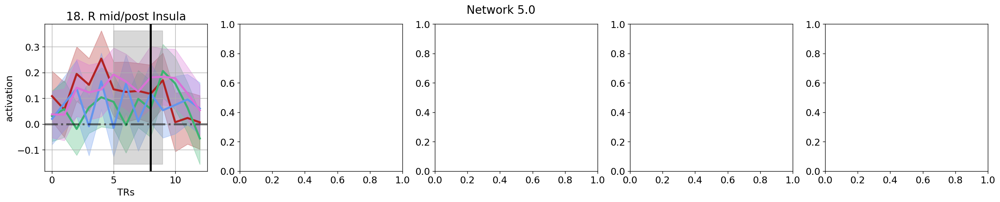

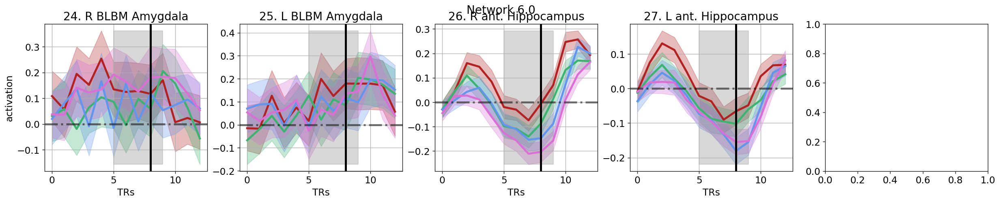

In [14]:
network_utils.plot_aba_nwwise_responses(
    args, 
    X, 
    partition, 
    block=None,
    ci=ciu
)

In [15]:
# storing in nifti file, 
# for viewing in afni
args.roi_mask_file = f"{args.proj_dir}/data/rois/aba/ABA_ROIs_final_gm_36.nii.gz"
mask = image.load_img(args.roi_mask_file)

roi_data = ciu[None, :]

ci_img = network_utils.store_roi_vec_as_niimg(
    args, 
    roi_data,
    mask
)
ci_img.to_filename(
    (
        f"{args.results_dir}/data-aba_rois-aba_period-LATE_"
        f"desc-network_partition_{args.num_nws}nws.nii.gz"
    )
)

  0%|          | 0/36 [00:00<?, ?it/s]

### ISC

high_Threat: (95, 36, 22)
low_Threat: (115, 36, 22)
high_Reward: (110, 36, 22)
low_Reward: (110, 36, 22)


100%|██████████| 4/4 [00:05<00:00,  1.32s/it]


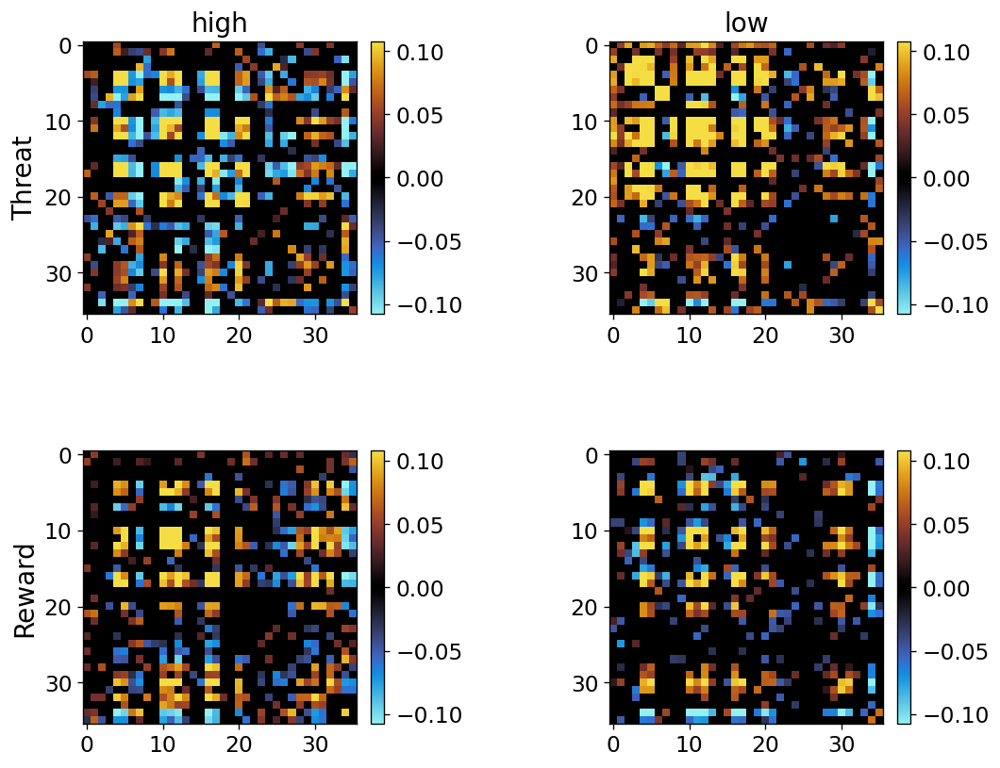

In [16]:
# subject-wise time series for LATE period
ts = dataset_utils.get_aba_block_time_series(
    args, 
    X, 
    trial_option='concat',
    subj_axis=-1,
    period='LATE',
)
for block in ts.keys():
    print(f"{block}: {ts[block].shape}")

# ISC
args.CORR_NAMES = ['isfcs', 'iscs']
args.pairwise=False
args.vectorize_isfcs = True
args.n_bootstraps = 1000
args.positive_only = False
(
    corrs, 
    bootstraps, 
    rois
) = isc_utils.get_isfcs(
    args, 
    ts
)
(
    observed_isfcs, observed_p_vals, 
    significant_rois, conf_intervals
) = isc_utils.get_squareform_matrices(
    args, 
    bootstraps, 
    rois,
    threshold_mats=True
)
isc_utils.plot_aba_isfcs(
    args, 
    observed_isfcs, 
    significant_rois,
    cmap=cmr.iceburn,
    corr_type='isfc'
)

## WHOLE period

### FC

high_Threat: (22, 247, 36)
low_Threat: (22, 299, 36)
high_Reward: (22, 286, 36)
low_Reward: (22, 286, 36)


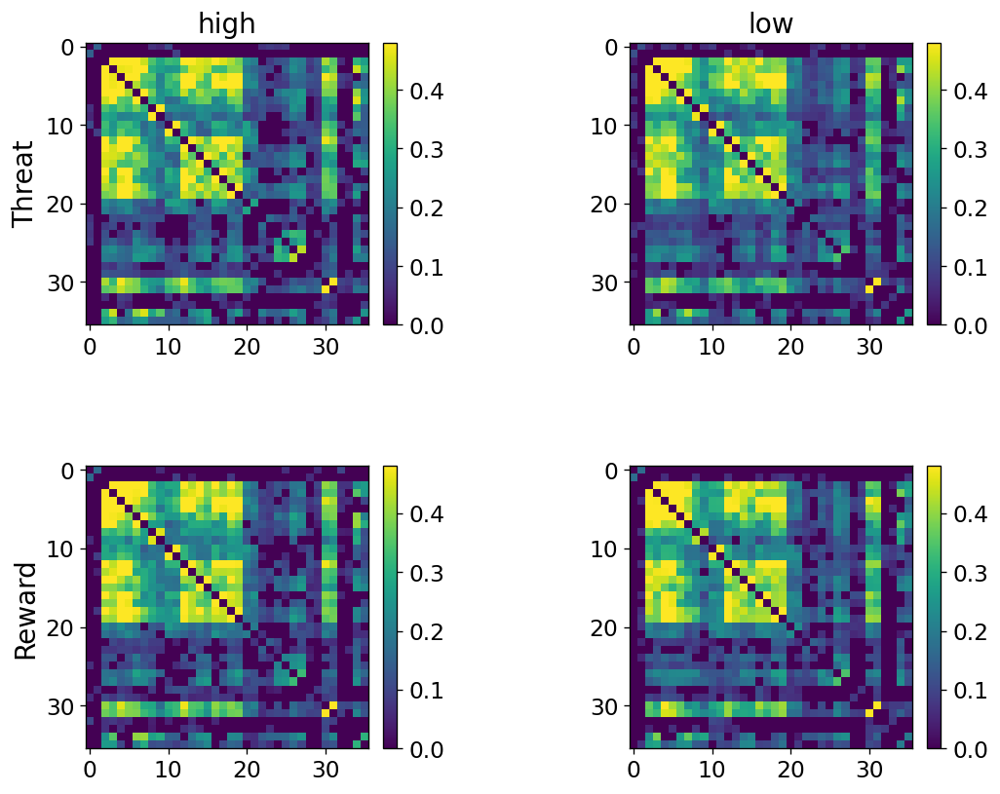

In [17]:
# subject-wise time series for WHOLE period
ts = dataset_utils.get_aba_block_time_series(
    args, 
    X, 
    trial_option='concat',
    subj_axis=0,
    period='WHOLE',
)
for block in ts.keys():
    print(f"{block}: {ts[block].shape}")

# FC
args.n_bootstraps = 1000
(
    corrs, 
    bootstraps, 
    rois
) = fc_utils.get_fcs(
    args, 
    ts, 
    print_stats=False
)

(
    observed_fcs, observed_p_vals, 
    significant_rois, conf_intervals
) = fc_utils.get_squareform_matrices(
    args, 
    bootstraps, 
    rois,
    threshold_mats=True
)

isc_utils.plot_aba_isfcs(
    args, 
    observed_fcs, 
    significant_rois,
    cmap=mpl.colormaps['viridis'],
    corr_type='fc'
)

### communities

In [18]:
args.gamma = 1.5
args.tau = 0.1
args.num_reps = 1000
(
    agreement_mat, 
    partition
) = network_utils.consensus_partition(
    args, 
    observed_fcs
)

  0%|          | 0/4 [00:00<?, ?it/s]

#### combining condition-wise partitions

In [19]:
cis = [partition[block] for block in partition.keys()]
cis = np.stack(cis, axis=-1)
D = bct.clustering.agreement(cis) / cis.shape[-1]
ciu = bct.clustering.consensus_und(
    D, 
    tau=args.tau,
    gamma=args.gamma,
    reps=args.num_reps,
    seed=args.SEED
)

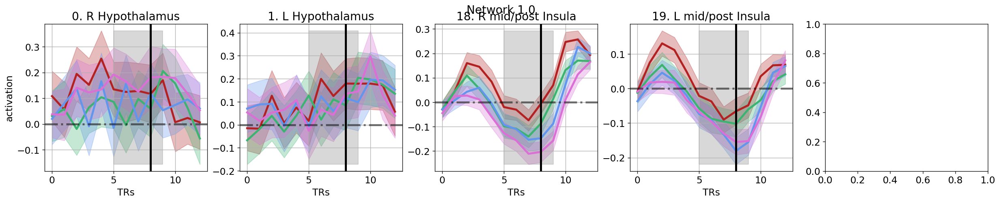

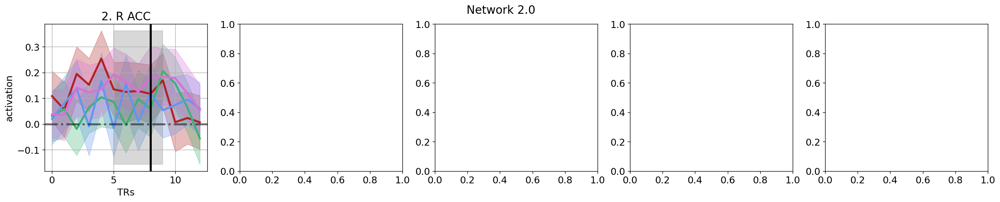

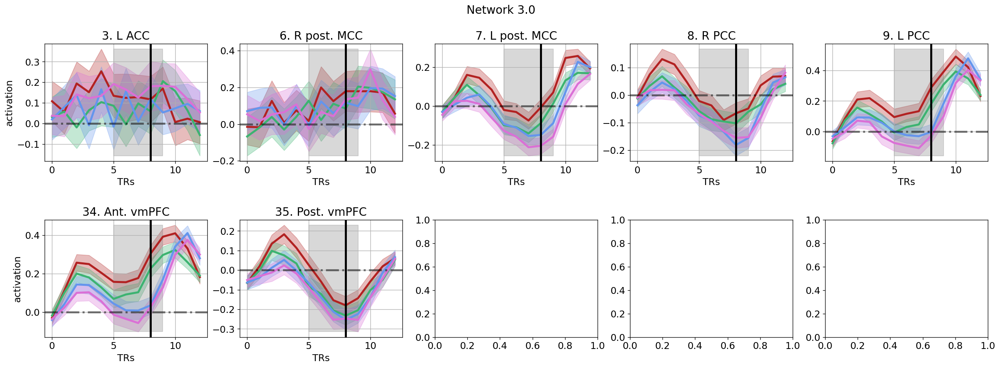

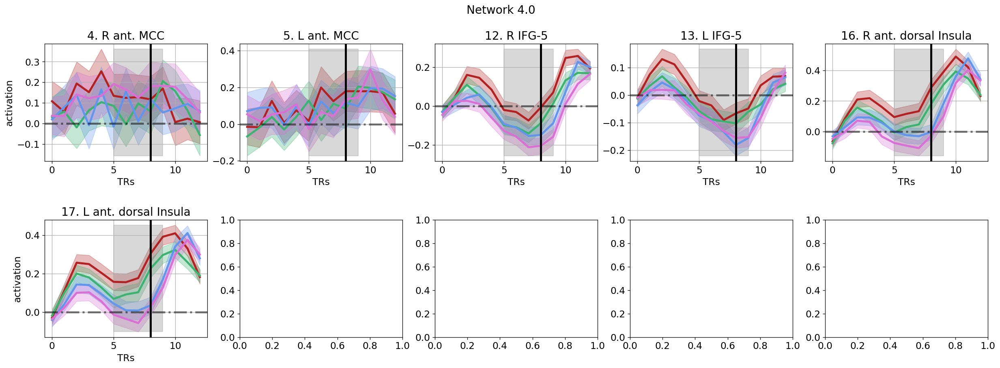

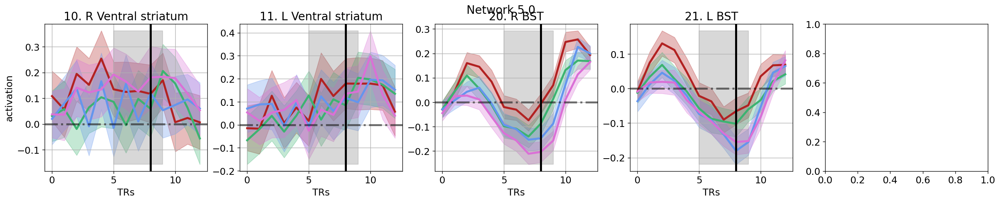

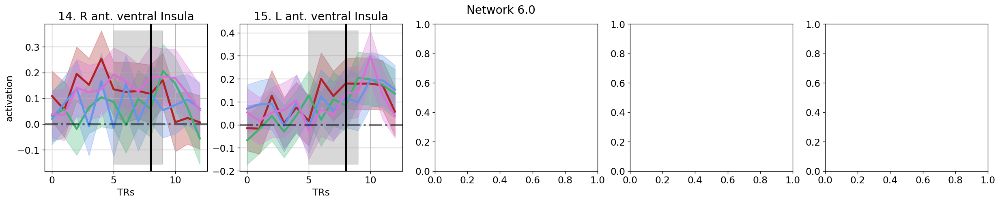

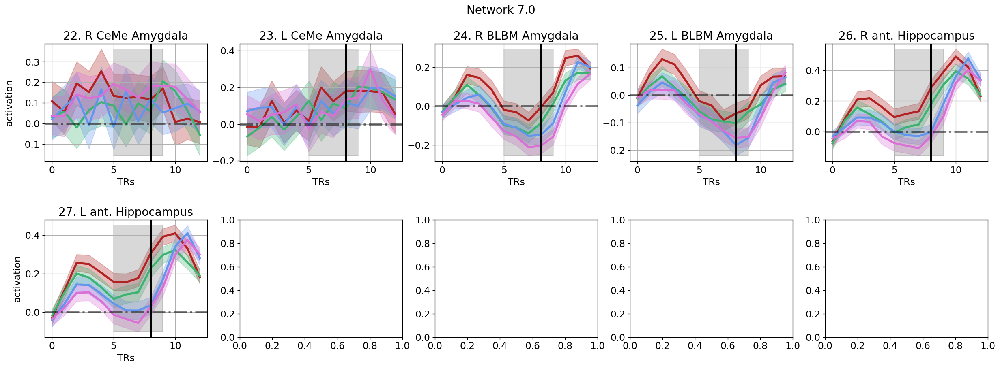

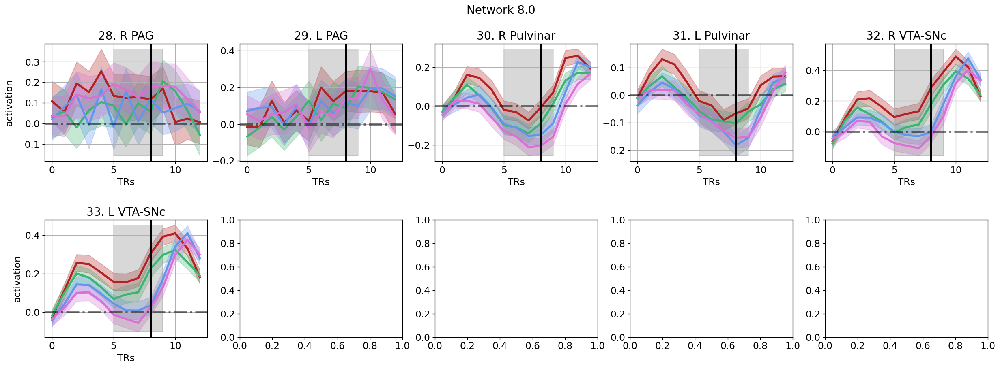

In [20]:
network_utils.plot_aba_nwwise_responses(
    args, 
    X, 
    partition, 
    block=None,
    ci=ciu
)

In [21]:
# storing in nifti file, 
# for viewing in afni
args.roi_mask_file = f"{args.proj_dir}/data/rois/aba/ABA_ROIs_final_gm_36.nii.gz"
mask = image.load_img(args.roi_mask_file)

roi_data = ciu[None, :]

ci_img = network_utils.store_roi_vec_as_niimg(
    args, 
    roi_data,
    mask
)
ci_img.to_filename(
    (
        f"{args.results_dir}/data-aba_rois-aba_period-WHOLE_"
        f"desc-network_partition_{args.num_nws}nws.nii.gz"
    )
)

  0%|          | 0/36 [00:00<?, ?it/s]

### ISC

high_Threat: (247, 36, 22)
low_Threat: (299, 36, 22)
high_Reward: (286, 36, 22)
low_Reward: (286, 36, 22)


100%|██████████| 4/4 [00:05<00:00,  1.39s/it]


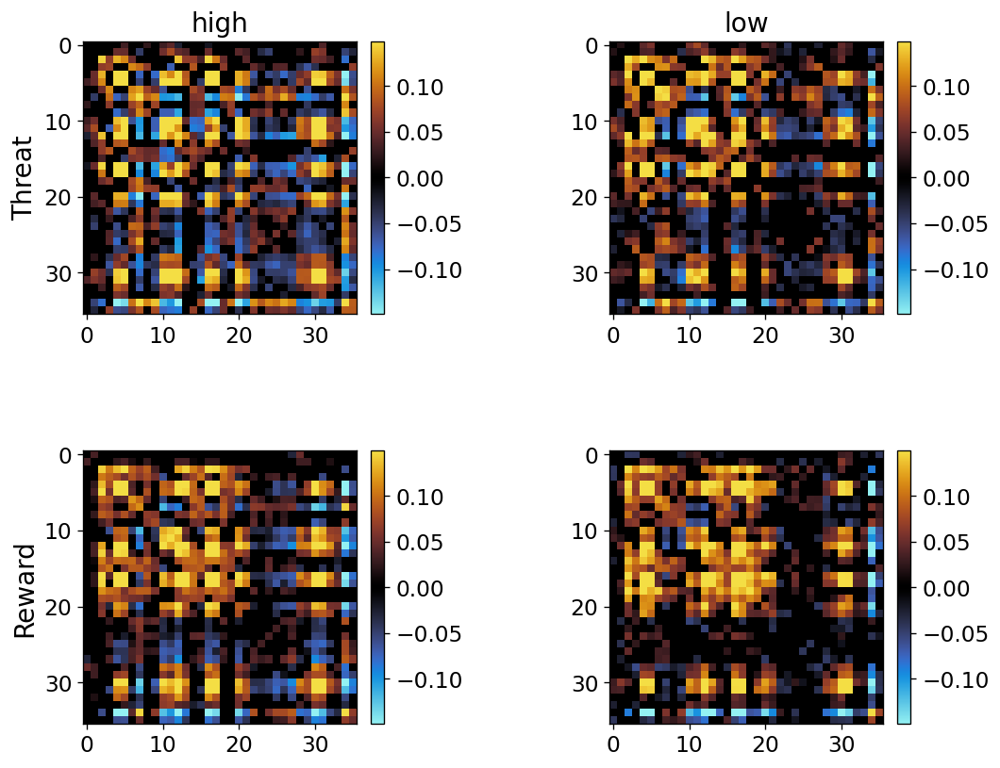

In [22]:
# subject-wise time series for WHOLE period
ts = dataset_utils.get_aba_block_time_series(
    args, 
    X, 
    trial_option='concat',
    subj_axis=-1,
    period='WHOLE',
)
for block in ts.keys():
    print(f"{block}: {ts[block].shape}")

# ISC
args.CORR_NAMES = ['isfcs', 'iscs']
args.pairwise=False
args.vectorize_isfcs = True
args.n_bootstraps = 1000
args.positive_only = False
(
    corrs, 
    bootstraps, 
    rois
) = isc_utils.get_isfcs(
    args, 
    ts
)
(
    observed_isfcs, observed_p_vals, 
    significant_rois, conf_intervals
) = isc_utils.get_squareform_matrices(
    args, 
    bootstraps, 
    rois,
    threshold_mats=True
)
isc_utils.plot_aba_isfcs(
    args, 
    observed_isfcs, 
    significant_rois,
    cmap=cmr.iceburn,
    corr_type='isfc'
)